# Import Libraries

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import datetime
from apyori import apriori
import networkx as nx
import scipy.stats as st



# Import data and adding datetime columns

In [2]:
df_full_curated = pd.read_csv('./curated/df_full_curated.csv')
df_full = df_full_curated
df_full['sex_category'] = df_full['sex'].astype('category').cat.codes
df_full['date'] = pd.to_datetime(df_full['date'], format="%Y-%m-%d %H:%M:%S.%f")
df_full['year'] = df_full['date'].dt.year
df_full['month'] = df_full['date'].dt.month
df_full['day'] = df_full['date'].dt.day
df_full['hour'] = df_full['date'].dt.hour
df_full['date_by_day'] = df_full['date'].dt.date

In [3]:
# We check integrity of date column in order to use it as index for our DF
print(df_full['date'].value_counts(ascending=False).max())
df_full = df_full.set_index(pd.to_datetime(df_full['date'], format="%Y-%m-%d %H:%M:%S.%f"))

1


We will use datetime column as index because it's unique

# Plotting price repartition  of sold products

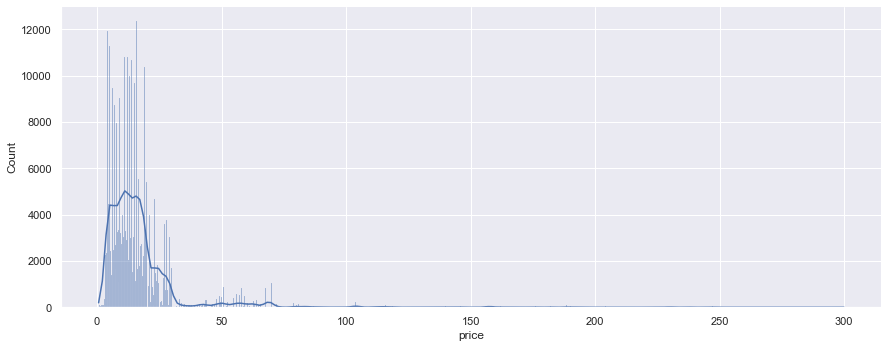

In [4]:
sns.set(rc={'figure.figsize':(15,10)})
# fig, ax = plt.subplots(figsize=(12,8))
sns.displot(df_full, x='price',kde=True, height=5, aspect=2.5)

<AxesSubplot:xlabel='price'>

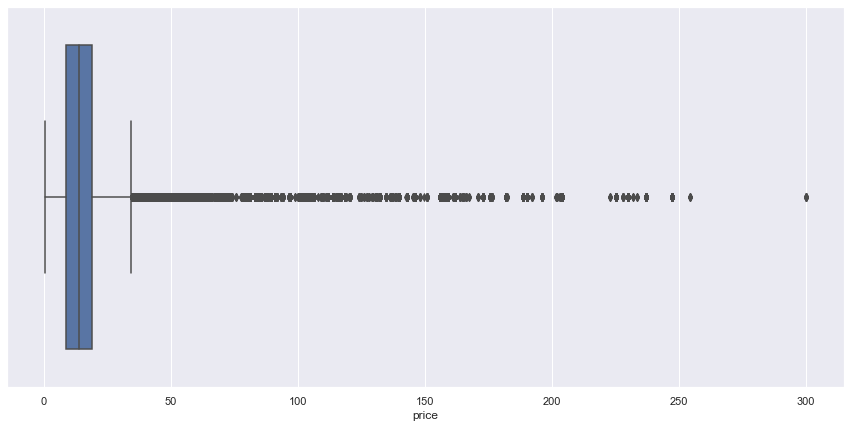

In [5]:
sns.set(rc={'figure.figsize':(15,7)})
sns.boxplot(x=df_full['price'])

# Indicateurs de tendance centrale et de dispersion


la repartition du price est :
mod:  0    15.99
dtype: float64
moy:  17.215188513734088
med:  13.9
var:  318.81598278368847
std:  17.85541886329437
skw:  5.479196379351586
kur:  45.42520484470879


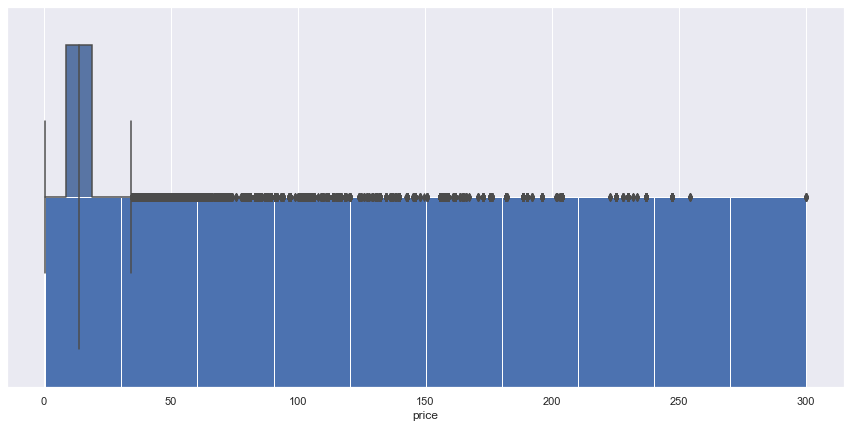


la repartition du consumer_age est :
mod:  0    41
dtype: int64
moy:  43.176432154386674
med:  41.0
var:  182.909753098325
std:  13.524413225656964
skw:  0.5804173699369056
kur:  0.45233507160756403


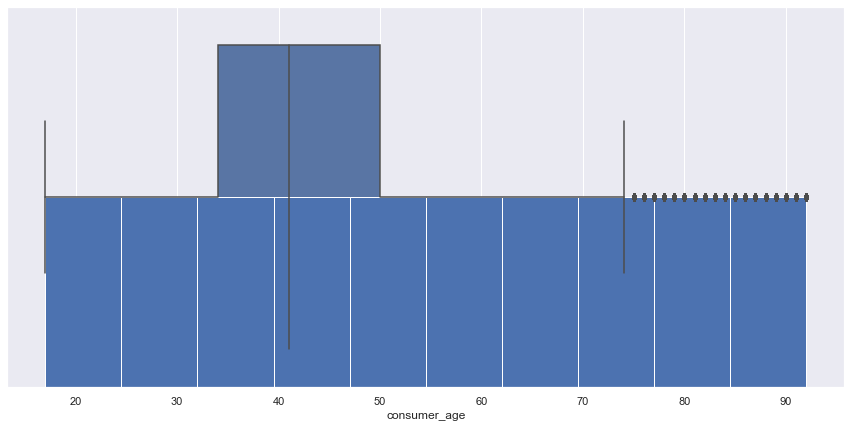

In [6]:
for col_name in ['price','consumer_age']:
    print(f'\nla repartition du {col_name} est :')
    print("mod: ",df_full[f'{col_name}'].mode())
    print("moy: ",df_full[f'{col_name}'].mean())
    print("med: ",df_full[f'{col_name}'].median())
    print("var: ",df_full[f'{col_name}'].var(ddof=0))
    print("std: ",df_full[f'{col_name}'].std(ddof=0))
    print("skw: ",df_full[f'{col_name}'].skew())
    print("kur: ",df_full[f'{col_name}'].kurtosis())
    df_full[f'{col_name}'].hist()
    sns.boxplot(x=df_full[f'{col_name}'])
    #df_full[f'{col_name}'].boxplot()
    plt.show()

# On voit ici que la clientelle est a parité

<AxesSubplot:xlabel='sex', ylabel='Count'>

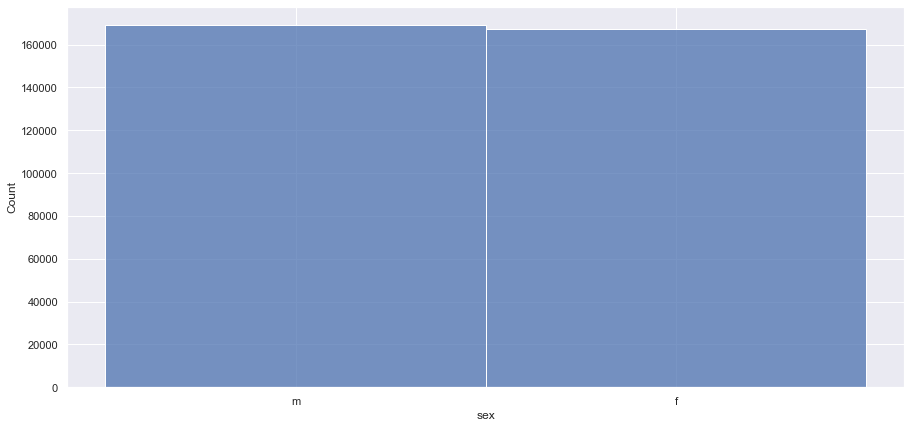

In [7]:
sns.histplot(data=df_full, x='sex')

# Courbe de lorenz et  Indice de gini

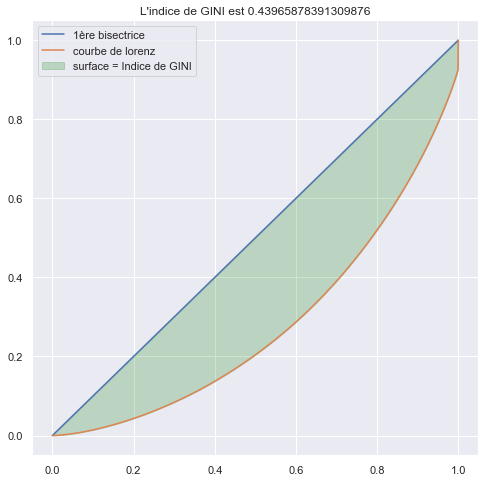

l'indice de gini est : 0.43965878391309876


In [8]:
#  On traite ici les dépenses totales des clients sur la periode (une année):
df_lorenz = df_full.groupby('client_id')['price'].sum()
plt.figure(figsize=(8, 8))
lorenz = np.cumsum(np.sort(df_lorenz)) / np.sum(df_lorenz)
lorenz = np.append([0],lorenz) # La courbe de Lorenz commence à 0
n = len(lorenz)
index = np.arange(n)/n
AUC = lorenz.sum()/n # Surface sous la courbe de Lorenz.
S = 0.5 - AUC # surface entre la première bissectrice et le courbe de Lorenz
gini = 2*S

plt.plot(index , index, label = '1ère bisectrice')
plt.plot(index , lorenz, label = 'courbe de lorenz' )
plt.fill_between(index, index,lorenz,alpha = 0.2,color = 'green', label = 'surface = Indice de GINI')
plt.legend()
plt.title(f"L'indice de GINI est {gini}")
plt.show()

print("l'indice de gini est :", gini)

# Agregation Corellations et TimeSeries 

## 1st timeSeriese Sales during the Year on all clients

<AxesSubplot:xlabel='date'>

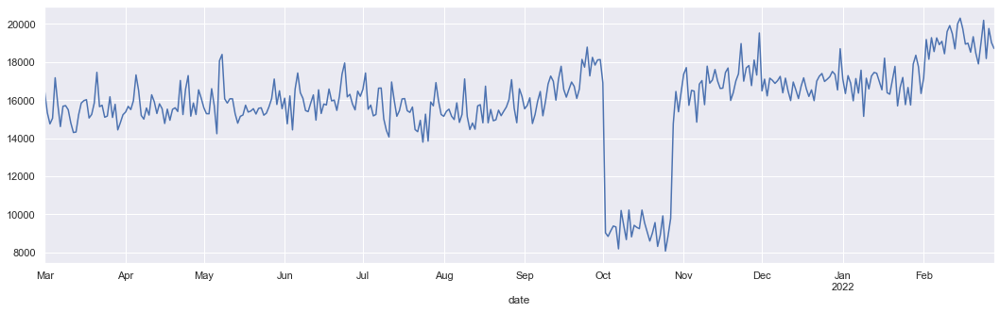

In [9]:
plt.figure(figsize=(18, 5))
df_full['price'].resample('D').sum().plot()

<AxesSubplot:xlabel='date'>

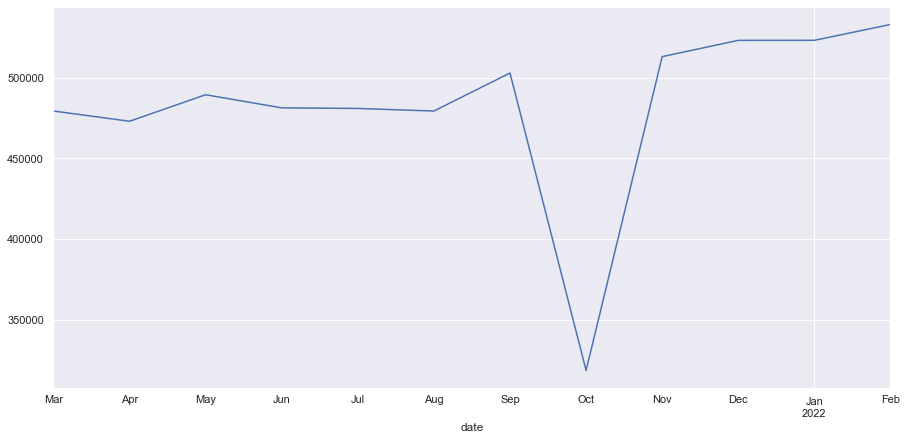

In [10]:
df_full['price'].resample('M').sum().plot()

<AxesSubplot:xlabel='date'>

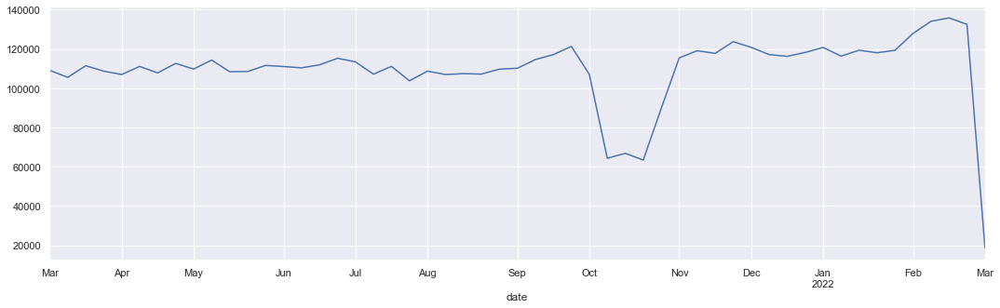

In [11]:
plt.figure(figsize=(18, 5))
df_full['price'].resample('W').sum().plot()

In [12]:
df_full.head(5)

,id_prod,date,session_id,client_id,sex,birth,price,categ,consumer_age,sex_category,year,month,day,hour,date_by_day
date,,,,,,,,,,,,,,,
2022-02-28 23:59:58.040472,0_1775,2022-02-28 23:59:58.040472,s_172423,c_1460,m,1989,6.99,0,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:59:02.381670,0_1403,2022-02-28 23:59:02.381670,s_172423,c_1460,m,1989,15.99,0,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:57:12.741573,0_1538,2022-02-28 23:57:12.741573,s_172424,c_1876,m,1983,8.61,0,38,1,2022,2,28,23,2022-02-28
2022-02-28 23:56:57.561424,1_370,2022-02-28 23:56:57.561424,s_172423,c_1460,m,1989,13.11,1,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:56:57.196281,1_456,2022-02-28 23:56:57.196281,s_172422,c_5787,f,1986,28.27,1,35,0,2022,2,28,23,2022-02-28


<ipython-input-13-19e6ce39c870>:2: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  df_full['2021-03-28']['price'].resample('H').sum().plot()


Text(0.5, 1.0, '2021-03-28 par heure')

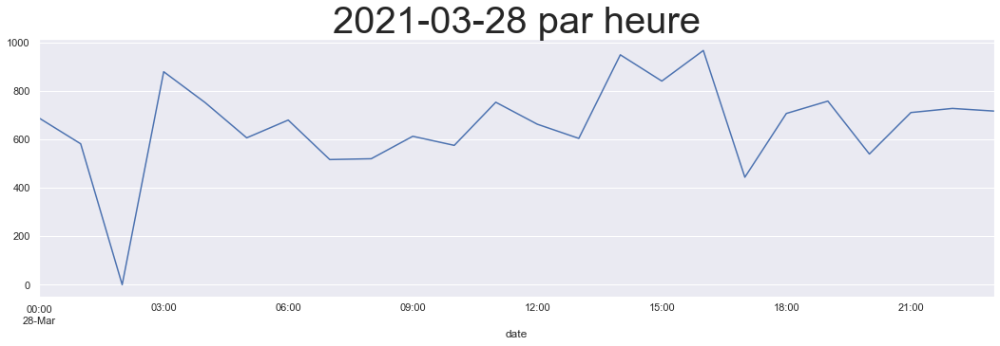

In [13]:
plt.figure(figsize=(18, 5))
df_full['2021-03-28']['price'].resample('H').sum().plot()
plt.title('2021-03-28 par heure',fontdict = {'fontsize' : 40})

## Agregation test

In [14]:
# Corrélation sex/categorie
df_full.pivot_table('client_id', index='sex', columns='categ',aggfunc='count')

categ,0,1,2
sex,,,
f,103786,55469,8260
m,105640,54266,9292


In [15]:
df_full.groupby('client_id')['date'].value_counts()

client_id  date                      
c_1        2021-06-11 21:02:39.382765    1
           2021-07-21 22:41:38.769525    1
           2021-07-25 12:17:34.446678    1
           2021-07-26 17:37:29.438136    1
           2021-07-27 10:30:00.293075    1
                                        ..
c_999      2022-01-16 23:40:14.387888    1
           2022-01-19 09:10:14.900805    1
           2022-01-24 09:39:50.831782    1
           2022-02-02 08:11:55.764086    1
           2022-02-22 22:55:44.758949    1
Name: date, Length: 336713, dtype: int64

In [16]:
nb_trans = df_full.groupby('client_id')[['client_id','session_id']].count()
print(nb_trans)
df_full.groupby('year')['price', 'birth'].mean()


           client_id  session_id
client_id                       
c_1               20          20
c_10              28          28
c_100              6           6
c_1000            56          56
c_1001            58          58
...              ...         ...
c_995              8           8
c_996             42          42
c_997             23          23
c_998             28          28
c_999             22          22

[8600 rows x 2 columns]


<ipython-input-16-4bafa02c6ab8>:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_full.groupby('year')['price', 'birth'].mean()


,price,birth
year,,
2021,17.062983,1977.870273
2022,17.933582,1977.603122


In [17]:
df_full.pivot_table('price', index='client_id', columns=['year'], aggfunc="sum")

year,2021,2022
client_id,,
c_1,294.66,5.99
c_10,586.18,NaN
c_100,222.87,NaN
c_1000,701.85,278.17
c_1001,999.57,102.88
...,...,...
c_995,119.08,NaN
c_996,666.01,73.59
c_997,513.78,59.11


# Encore des agregations

In [18]:
df_full.head(5)

,id_prod,date,session_id,client_id,sex,birth,price,categ,consumer_age,sex_category,year,month,day,hour,date_by_day
date,,,,,,,,,,,,,,,
2022-02-28 23:59:58.040472,0_1775,2022-02-28 23:59:58.040472,s_172423,c_1460,m,1989,6.99,0,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:59:02.381670,0_1403,2022-02-28 23:59:02.381670,s_172423,c_1460,m,1989,15.99,0,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:57:12.741573,0_1538,2022-02-28 23:57:12.741573,s_172424,c_1876,m,1983,8.61,0,38,1,2022,2,28,23,2022-02-28
2022-02-28 23:56:57.561424,1_370,2022-02-28 23:56:57.561424,s_172423,c_1460,m,1989,13.11,1,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:56:57.196281,1_456,2022-02-28 23:56:57.196281,s_172422,c_5787,f,1986,28.27,1,35,0,2022,2,28,23,2022-02-28


In [19]:
stuff_for_etienne = df_full.groupby('session_id')['id_prod'].count()
stuff_for_etienne.max()

14

In [20]:
df_full['id_prod'].value_counts()

1_369     1081
1_417     1062
1_498     1036
1_414     1027
1_425     1013
          ... 
2_23         1
2_98         1
0_495        1
0_1858       1
0_1151       1
Name: id_prod, Length: 3264, dtype: int64

# Séparation pro et particuliers

## Calcul Z-score

In [49]:
nb_sales = df_full['client_id'].value_counts(ascending=False)
zscore = (nb_sales - nb_sales.mean()) / nb_sales.std()
print(zscore.head(5),zscore.tail(4))

c_1609    81.924906
c_6714    28.330446
c_3454    20.672269
c_4958    16.127223
c_7959     0.996249
Name: client_id, dtype: float64 c_4391   -0.24389
c_4679   -0.24389
c_6292   -0.24389
c_8005   -0.24389
Name: client_id, dtype: float64


## Avec un écart de 2 * zscore :
## -les outliers en partie superieur sont au nombre de 4, ce sont les professionels.
## -il n'y a pas d'outliers en partie inferieur.

In [53]:
df_pro = df_full[df_full['client_id'].isin(zscore[zscore>2].index)]
df_particuliers = df_full[df_full['client_id'].isin(zscore[zscore<2].index)]

In [54]:
df_particuliers.shape

(313552, 15)

# Mission 3 : Recherche de corellations

## On étudie ici des corellations entre des caracteristiques des clients et les achats effectués
## Pour cela on excluera les profils 'professionels' qui sont au nombre de 4
## On pourra les traiter séparément par la suite

In [23]:
age_category = pd.cut(df_particuliers['consumer_age'],[0,25,45,60,110])

## M3_Q1 Corrélation entre le sexe des clients et les catégories de produits achetés

categ       0       1      2   Total
sex                                 
f      101148   53774   8122  163044
m       94023   48851   7634  150508
Total  195171  102625  15756  313552


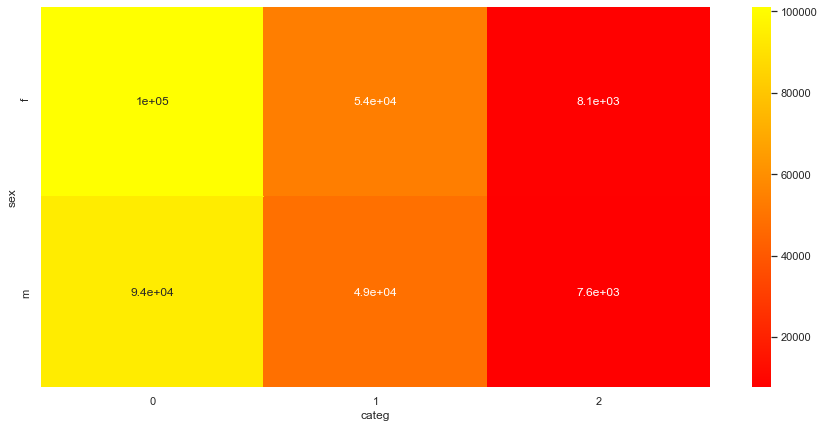

In [24]:
sns.heatmap(df_particuliers.pivot_table('client_id', index='sex', columns='categ',aggfunc='count'),annot=True,cmap='autumn')
df_q1 = df_particuliers.pivot_table('client_id', index='sex', columns='categ',aggfunc='count',margins=True,margins_name="Total")
print(df_q1)

categ,0,1,2
sex,,,
f,0.111009,0.308749,0.060252
m,0.120255,0.334465,0.065270


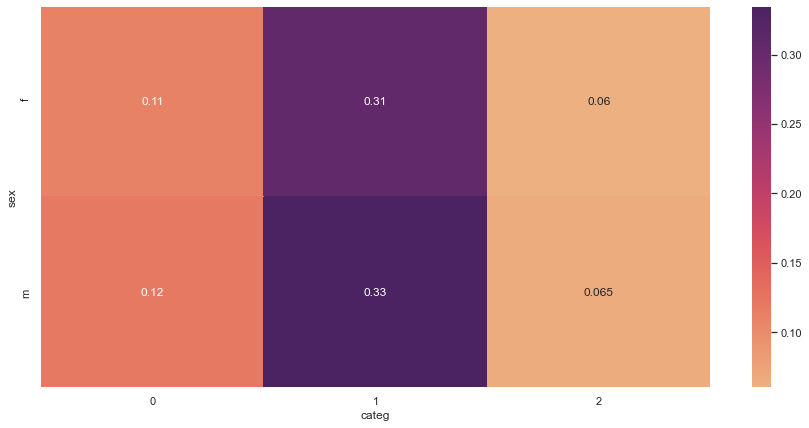

In [25]:
tx = df_q1.loc[:,["Total"]]
ty = df_q1.loc[["Total"],:]
n = df_q1["Total"]["Total"]
indep_q1 = tx.dot(ty) / n
xi_q1 = (df_q1-indep_q1)**2/indep_q1
xi_n_q1 = xi_q1.sum().sum()
xi_n_q1_final = xi_q1/xi_n_q1
xi_n_q1_final = xi_n_q1_final.drop(['Total'],axis=1)
xi_n_q1_final = xi_n_q1_final.drop(['Total'],axis=0)
sns.heatmap(xi_n_q1_final,annot=True,cmap="flare")
xi_n_q1_final


In [26]:
t_score = 5.99
print (f"On a Khi2 = {xi_n_q1} et T-score = {t_score} pour 5% d'erreur")
print (f"l'hypotèse sex et categorie sont indépendants est donc {xi_n_q1<t_score} pour 5% d'erreur")

On a Khi2 = 10.202417277273174 et T-score = 5.99 pour 5% d'erreur
l'hypotèse sex et categorie sont indépendants est donc False pour 5% d'erreur


## Correlation entre l'age des clients et

In [27]:
freq_by_age = df_particuliers.groupby(['client_id','month'])['date'].count()
freq_by_age.unstack()

month,1,2,3,4,5,6,7,8,9,10,11,12
client_id,,,,,,,,,,,,
c_1,NaN,1.0,NaN,NaN,NaN,1.0,4.0,1.0,2.0,1.0,7.0,3.0
c_10,NaN,NaN,1.0,7.0,NaN,1.0,3.0,4.0,5.0,NaN,2.0,5.0
c_100,NaN,NaN,NaN,1.0,NaN,2.0,NaN,3.0,NaN,NaN,NaN,NaN
c_1000,3.0,11.0,9.0,1.0,3.0,3.0,2.0,5.0,6.0,3.0,5.0,5.0
c_1001,NaN,9.0,6.0,5.0,NaN,1.0,NaN,3.0,10.0,6.0,8.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...
c_995,NaN,NaN,NaN,1.0,2.0,NaN,2.0,2.0,NaN,NaN,1.0,NaN
c_996,2.0,2.0,10.0,2.0,5.0,2.0,4.0,3.0,NaN,1.0,4.0,7.0
c_997,4.0,NaN,NaN,1.0,2.0,2.0,1.0,1.0,7.0,1.0,4.0,NaN


## M3_Q2 Corellation entre l'age et le montant total des achats

### Avec tous les ages

### Dépenses totales

[]

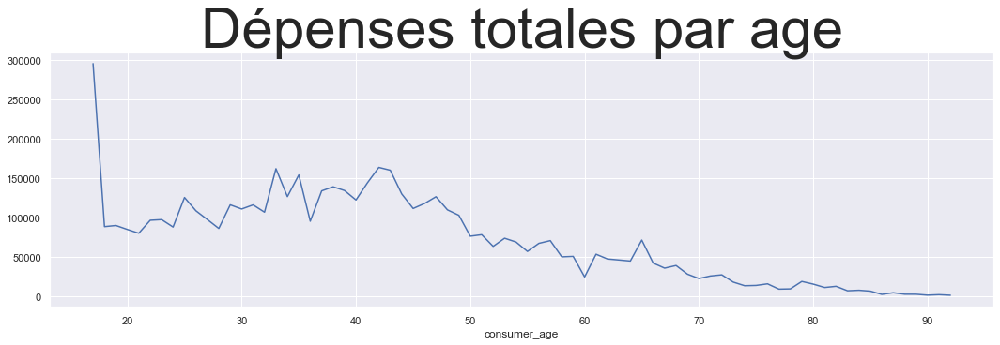

In [28]:
df_corell_2_total = df_particuliers.pivot_table('price',index ='client_id',columns ='consumer_age' ,aggfunc='sum')
plt.figure(figsize=(18, 5))
df_corell_2_total.sum().plot()
plt.title('Dépenses totales par age',fontdict = {'fontsize' : 60})
plt.plot()

### Dépenses moyennes

Le score de corellation est -0.7489131423872313 et la p_value2 est 7.29407861336569e-15


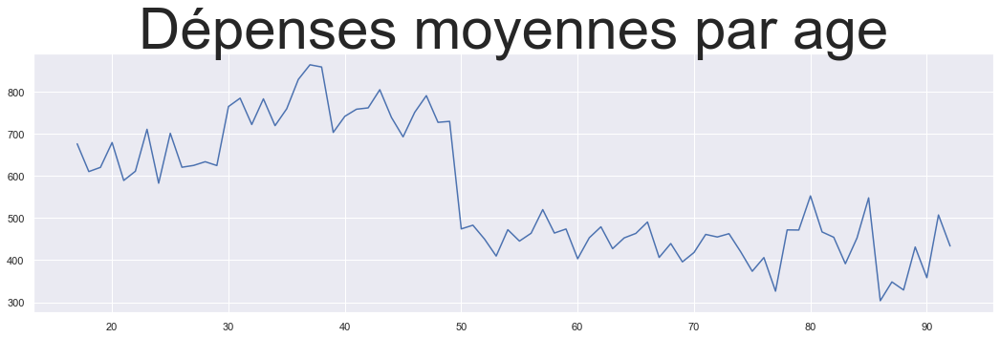

In [29]:
df_corell_2_mean = df_particuliers.groupby('consumer_age',as_index=False).agg({'client_id':'nunique','price':'sum'})
df_corell_2_mean['mean'] = df_corell_2_mean['price']/df_corell_2_mean['client_id']
[corell_sore_2_mean, p_value_2_mean] = st.pearsonr(df_corell_2_mean['consumer_age'],df_corell_2_mean['mean'])
print(f'Le score de corellation est {corell_sore_2_mean} et la p_value2 est {p_value_2_mean}')
plt.figure(figsize=(18, 5))
plt.title('Dépenses moyennes par age',fontdict = {'fontsize' : 60})
plt.plot(df_corell_2_mean['consumer_age'],df_corell_2_mean['mean'])

{{p_value2}}

### Dépenses pour chaque client par age

In [88]:
df_corell_2_all = df_particuliers.groupby(['client_id','consumer_age'],as_index=False)['price'].sum()
df_corell_2_all

,client_id,consumer_age,price
0,c_1,66,300.65
1,c_10,65,586.18
2,c_100,29,222.87
3,c_1000,55,980.02
4,c_1001,39,1102.45
...,...,...,...
8591,c_995,66,119.08
8592,c_996,51,739.60
8593,c_997,27,572.89
8594,c_998,20,1527.69


In [91]:
[corell_sore_2_all, p_value_2_all] = st.pearsonr(df_corell_2_all['consumer_age'],df_corell_2_all['price'])
print('le score de corellation est:',corell_sore_2_all, '\n la p-value est:',p_value_2_all)

le score de corellation est: -0.19042316059607656 
 la p-value est: 5.3395456865747425e-71


<AxesSubplot:xlabel='consumer_age', ylabel='price'>

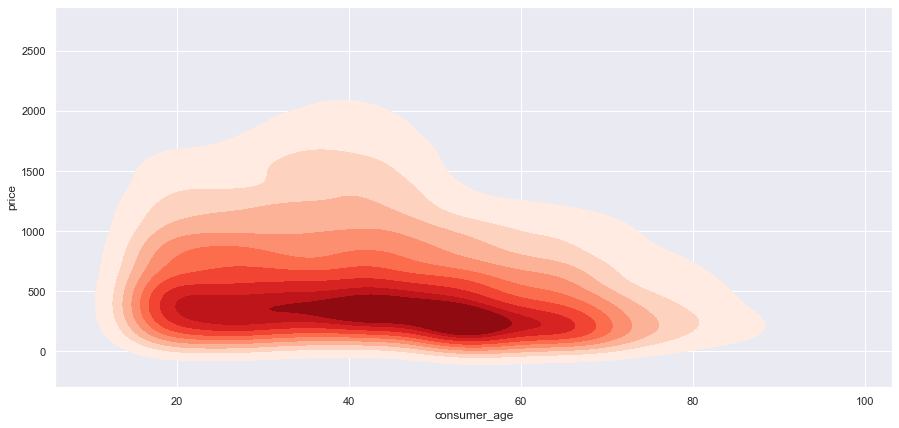

In [32]:
sns.kdeplot(data = df_corell_2_all, x=df_corell_2_all['consumer_age'], y=df_corell_2_all['price'], cmap="Reds", shade=True)


### Avec des categories

In [33]:
df_corell_2_by_cat = df_particuliers.pivot_table('price',index ='client_id',columns = age_category ,aggfunc='sum')
#df_corell_2_by_cat.sum().histplot()

## M3_Q3 Corellation frequence d'achat par mois et tranche d'age

month,1,2,3,4,5,6,7,8,9,10,11,12
consumer_age,,,,,,,,,,,,
"(0, 25]",2362,2498,2046,2091,2187,2252,2530,2300,1858,1402,2324,2151
"(25, 45]",14313,14745,14708,14915,14563,13447,12110,13040,17579,12162,13866,16327
"(45, 60]",6905,6740,6480,6250,6258,6126,5325,5627,7627,4610,6429,7556
"(60, 110]",3806,3548,3373,3172,3216,3183,3084,2950,3855,1862,3660,4134


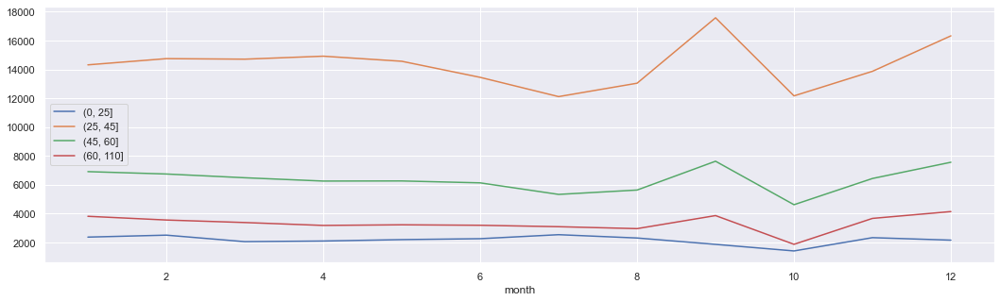

In [34]:
df_age_by_month = df_particuliers.pivot_table('date_by_day', index=age_category, columns='month',aggfunc='count')
plt.figure(figsize=(18, 5))
for i in range(df_age_by_month.shape[0]):
    df_age_by_month.iloc[i].plot(label = df_age_by_month.index[i])
plt.legend()
plt.plot()
df_age_by_month

<AxesSubplot:xlabel='month', ylabel='consumer_age'>

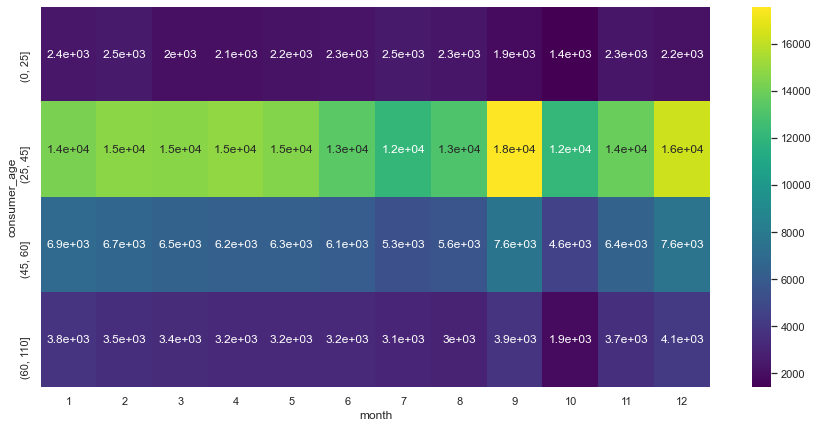

In [35]:
sns.heatmap(df_age_by_month,annot=True,cmap="viridis")

In [93]:
df_particuliers.head(5)

,id_prod,date,session_id,client_id,sex,birth,price,categ,consumer_age,sex_category,year,month,day,hour,date_by_day
date,,,,,,,,,,,,,,,
2022-02-28 23:59:58.040472,0_1775,2022-02-28 23:59:58.040472,s_172423,c_1460,m,1989,6.99,0,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:59:02.381670,0_1403,2022-02-28 23:59:02.381670,s_172423,c_1460,m,1989,15.99,0,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:57:12.741573,0_1538,2022-02-28 23:57:12.741573,s_172424,c_1876,m,1983,8.61,0,38,1,2022,2,28,23,2022-02-28
2022-02-28 23:56:57.561424,1_370,2022-02-28 23:56:57.561424,s_172423,c_1460,m,1989,13.11,1,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:56:57.196281,1_456,2022-02-28 23:56:57.196281,s_172422,c_5787,f,1986,28.27,1,35,0,2022,2,28,23,2022-02-28


In [96]:
df_age_by_month_total = df_particuliers.pivot_table('date_by_day', index='consumer_age',columns='month',aggfunc='count')
df_age_by_month_total

month,1,2,3,4,5,6,7,8,9,10,11,12
consumer_age,,,,,,,,,,,,
17,693,728,596,581,646,645,681,652,521,378,574,653
18,191,212,207,175,178,164,253,206,150,133,175,138
19,182,210,136,207,185,258,209,186,180,119,195,156
20,177,199,170,173,152,140,195,202,144,91,217,172
21,224,210,187,191,152,186,193,191,121,116,230,173
...,...,...,...,...,...,...,...,...,...,...,...,...
88,13,29,10,6,17,14,8,22,15,12,9,8
89,9,15,17,16,6,13,14,12,9,18,22,8
90,4,9,12,7,8,8,2,9,5,6,10,4


In [102]:
df_age_by_month_total.columns

Int64Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], dtype='int64', name='month')

In [111]:
for i in range (df_age_by_month_total.shape[1]):
#df_age_by_month_total.columns[i]
    print(f"pour le mois {i+1} on a :",st.pearsonr(df_age_by_month_total.index,df_age_by_month_total[df_age_by_month_total.columns[i]]))

pour le mois 1 on a : (-0.5765323944014649, 5.02999697904216e-08)
pour le mois 2 on a : (-0.584973690934522, 2.870483569083235e-08)
pour le mois 3 on a : (-0.5589913217687433, 1.5361049967434725e-07)
pour le mois 4 on a : (-0.5658554443419685, 1.0000749082348582e-07)
pour le mois 5 on a : (-0.5612602862406175, 1.3343653631405543e-07)
pour le mois 6 on a : (-0.5943553352340241, 1.5098822097983906e-08)
pour le mois 7 on a : (-0.6405380476307327, 4.624845976721901e-10)
pour le mois 8 on a : (-0.6122953857031346, 4.166925835624923e-09)
pour le mois 9 on a : (-0.5001117479927313, 4.225959712444926e-06)
pour le mois 10 on a : (-0.5321196325297819, 7.537305292221063e-07)
pour le mois 11 on a : (-0.5844240411792065, 2.97871441437694e-08)
pour le mois 12 on a : (-0.5338510993344328, 6.831126055828062e-07)


In [ ]:
tx = df_age_by_month_total.loc[:,["Total"]]
ty = df_age_by_month_total.loc[["Total"],:]
n = df_age_by_month_total["Total"]["Total"]
indep_q1 = tx.dot(ty) / n
xi_q1 = (df_q1-indep_q1)**2/indep_q1
xi_n_q1 = xi_q1.sum().sum()
xi_n_q1_final = xi_q1/xi_n_q1
xi_n_q1_final = xi_n_q1_final.drop(['Total'],axis=1)
xi_n_q1_final = xi_n_q1_final.drop(['Total'],axis=0)
sns.heatmap(xi_n_q1_final,annot=True,cmap="flare")
xi_n_q1_final

In [ ]:
[chi2_freq, pvalue_freq, freedom_freq, expected_freq] = st.chi2_contingency(df_age_by_month)
print(f'la valeur chi2 est :{chi2_freq} la p_value est {pvalue_freq}' )

la valeur chi2 est :1211.1395995504008 la p_value est 2.6545878810380936e-233


## M3_Q4 Corellation taille du panier en nombre d'articles et tranche d'age

In [37]:
df_corell_4 = df_particuliers.pivot_table('id_prod',index ='session_id',columns = age_category ,aggfunc='count')
print(df_corell_4.astype(bool).sum(axis=0).sum() == df_particuliers['session_id'].nunique())
mean_nb_article = df_corell_4.sum() / df_corell_4.astype(bool).sum(axis=0)
mean_nb_article
# Plot an histogram 

True


consumer_age
(0, 25]      1.762899
(25, 45]     2.361071
(45, 60]     1.769052
(60, 110]    1.456037
dtype: float64

In [38]:
df_particuliers.pivot_table('id_prod',index ='session_id',columns = 'consumer_age' ,aggfunc='count')

consumer_age,17,18,19,20,21,22,23,24,25,26,...,83,84,85,86,87,88,89,90,91,92
session_id,,,,,,,,,,,,,,,,,,,,,
s_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
s_10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
s_100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
s_1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
s_10000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_99994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
s_99995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
s_99996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [39]:
stuff = df_particuliers.pivot_table('id_prod',index ='session_id',columns = 'consumer_age' ,aggfunc='count').sum()


In [40]:
stuff

consumer_age
17    7348.0
18    2182.0
19    2223.0
20    2032.0
21    2174.0
       ...  
88     163.0
89     159.0
90      84.0
91     115.0
92      86.0
Length: 76, dtype: float64

<AxesSubplot:xlabel='consumer_age'>

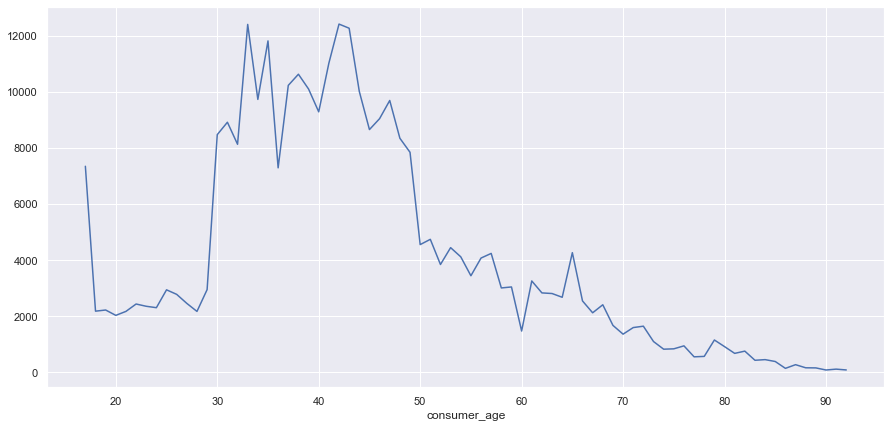

In [41]:
stuff.plot()

## M3_Q5 Corellation entre la tranche d'age des clients et les categories de produits achetés

In [42]:
df_particuliers.pivot_table('client_id', index=age_category, columns='categ',aggfunc='count')

categ,0,1,2
consumer_age,,,
"(0, 25]",5989,9642,10370
"(25, 45]",126470,40723,4582
"(45, 60]",44931,30533,469
"(60, 110]",17781,21727,335


In [119]:
df_corell_5 = df_particuliers.pivot_table('client_id', index='consumer_age', columns='categ',aggfunc='count')
df_corell_5.columns

Int64Index([0, 1, 2], dtype='int64', name='categ')

In [112]:
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT

## test

In [58]:
df_full.sort_values(by='id_prod', ascending=False)

,id_prod,date,session_id,client_id,sex,birth,price,categ,consumer_age,sex_category,year,month,day,hour,date_by_day
date,,,,,,,,,,,,,,,
2021-07-11 20:56:49.820935,2_99,2021-07-11 20:56:49.820935,s_61009,c_7135,m,1996,84.99,2,25,1,2021,7,11,20,2021-07-11
2021-11-21 01:53:46.967570,2_99,2021-11-21 01:53:46.967570,s_122697,c_5828,f,1998,84.99,2,23,0,2021,11,21,1,2021-11-21
2021-03-08 21:10:32.250919,2_98,2021-03-08 21:10:32.250919,s_3637,c_5967,f,2003,149.74,2,18,0,2021,3,8,21,2021-03-08
2022-02-28 07:31:38.046261,2_97,2022-02-28 07:31:38.046261,s_172057,c_2469,m,1999,160.99,2,22,1,2022,2,28,7,2022-02-28
2022-01-31 09:37:00.283109,2_97,2022-01-31 09:37:00.283109,s_157815,c_2989,f,2003,160.99,2,18,0,2022,1,31,9,2022-01-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-15 17:26:41.667306,0_0,2021-06-15 17:26:41.667306,s_49107,c_7321,m,1985,3.75,0,36,1,2021,6,15,17,2021-06-15
2021-12-07 01:57:35.775315,0_0,2021-12-07 01:57:35.775315,s_130554,c_7055,m,1977,3.75,0,44,1,2021,12,7,1,2021-12-07
2021-05-12 03:38:01.349280,0_0,2021-05-12 03:38:01.349280,s_33316,c_6205,f,1984,3.75,0,37,0,2021,5,12,3,2021-05-12


# Nouveau dataframe pour les bonus

In [55]:
my_agg_func = {'id_prod':lambda x:list(x), 'price':[lambda x:list(x),'sum','mean','max','min'] }
df_panier = df_particuliers.groupby(['session_id','client_id','date_by_day','sex','consumer_age'], as_index=False).agg(my_agg_func)

In [9]:
df_panier

session_id client_id date_by_day sex consumer_age  \
                                                           
0             s_1     c_329  2021-03-01   f           54   
1            s_10    c_2218  2021-03-01   f           51   
2           s_100    c_3854  2021-03-01   f           43   
3          s_1000    c_1014  2021-03-03   m           32   
4         s_10000     c_476  2021-03-22   f           32   
...           ...       ...         ...  ..          ...   
159268    s_99994    c_7685  2021-10-04   m           38   
159269    s_99995    c_4170  2021-10-04   f           61   
159270    s_99996    c_4900  2021-10-04   f           47   
159271    s_99997    c_3521  2021-10-04   f           42   
159272    s_99998    c_2795  2021-10-04   f           43   

                                 id_prod                        price         \
                                <lambda>                   <lambda_0>    sum   
0                               [0_1259]                      [11.99]  11.99   
1                                [1_635]                      [26.99]  26.99   
2                       [0_1451, 0_1030]               [19.99, 13.73]  33.72   
3       [0_1438, 0_1449, 0_1590, 0_1625]    [9.31, 4.99, 18.93, 5.99]  39.22   
4                [0_1418, 0_1324, 1_395]          [8.57, 3.93, 28.99]  41.49   
...                                  ...                          ...    ...   
159268          [0_1636, 0_1407, 0_2060]          [9.45, 13.99, 5.48]  28.92   
159269                          [0_1784]                      [19.84]  19.84   
159270  [0_1362, 0_1475, 0_1609, 0_2231]  [11.3, 11.99, 18.99, 13.99]  56.27   
159271                          [0_1197]                       [6.99]   6.99   
159272          [0_1604, 0_1411, 0_1572]          [17.51, 8.99, 8.61]  35.11   

                                 
             mean    max    min  
0       11.990000  11.99  11.99  
1       26.990000  26.99  26.99  
2       16.860000  19.99  13.73  
3        9.805000  18.93   4.99  
4       13.830000  28.99   3.93  
...           ...    ...    ...  
159268   9.640000  13.99   5.48  
159269  19.840000  19.84  19.84  
159270  14.067500  18.99  11.30  
159271   6.990000   6.99   6.99  
159272  11.703333  17.51   8.61  

[159273 rows x 11 columns]

In [59]:
df_panier.columns = ['session_id','client_id','date_by_day','sex','consumer_age','list_prod','list_price','sum','mean','max','min']
df_panier['date_by_day'] = pd.to_datetime(df_panier['date_by_day'], format="%Y-%m-%d ")

In [11]:
df_panier_jour = df_panier.groupby(['date_by_day'],as_index=False ).agg({'sum':[sum,'mean',min,max],'session_id':'count'})

df_panier_jour = df_panier_jour.set_index(pd.to_datetime(df_panier_jour['date_by_day'], format="%Y-%m-%d "))

df_panier_jour.columns = ['date_by_day','ca_jour', 'mean', 'min', 'max','nb_paniers']
df_panier_jour['dayofweek']=df_panier_jour['date_by_day'].dt.dayofweek
df_panier_jour.head(5)

,date_by_day,ca_jour,mean,min,max,nb_paniers,dayofweek
date_by_day,,,,,,,
2021-03-01,2021-03-01,15319.67,33.522254,3.15,247.22,457,0
2021-03-02,2021-03-02,14409.49,32.235996,1.67,283.46,447,1
2021-03-03,2021-03-03,13602.03,33.668391,3.64,285.98,404,2
2021-03-04,2021-03-04,13418.64,32.334072,3.33,226.98,415,3
2021-03-05,2021-03-05,15918.13,34.604630,2.41,320.20,460,4


## Chiffre d'affaire par jour de la semaine

<AxesSubplot:xlabel='date_by_day'>

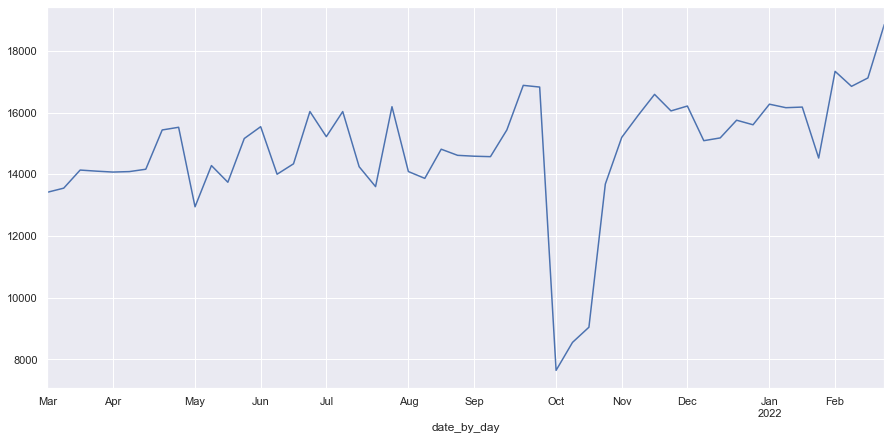

In [49]:
df_panier_jour['ca_jour'][df_panier_jour['dayofweek']== 3].plot()

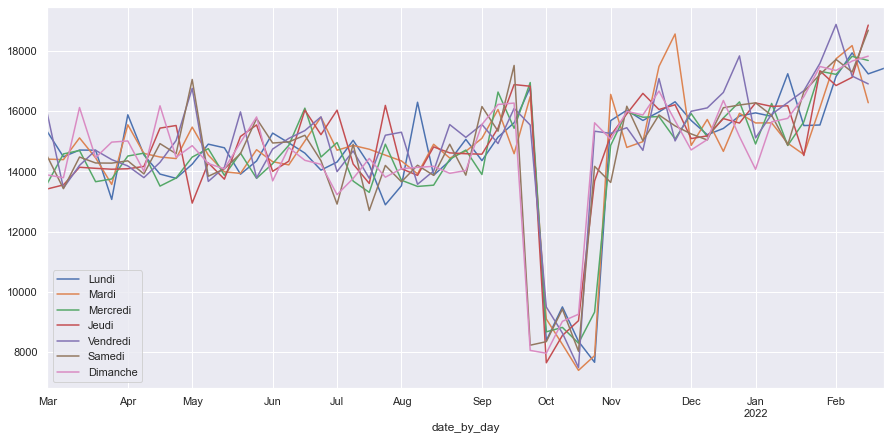

In [50]:
jours = ['Lundi','Mardi','Mercredi','Jeudi','Vendredi','Samedi','Dimanche']
for i in range(7):
    df_panier_jour['ca_jour'][df_panier_jour['dayofweek']== i].plot(label = jours[i])
    plt.legend()
plt.show()

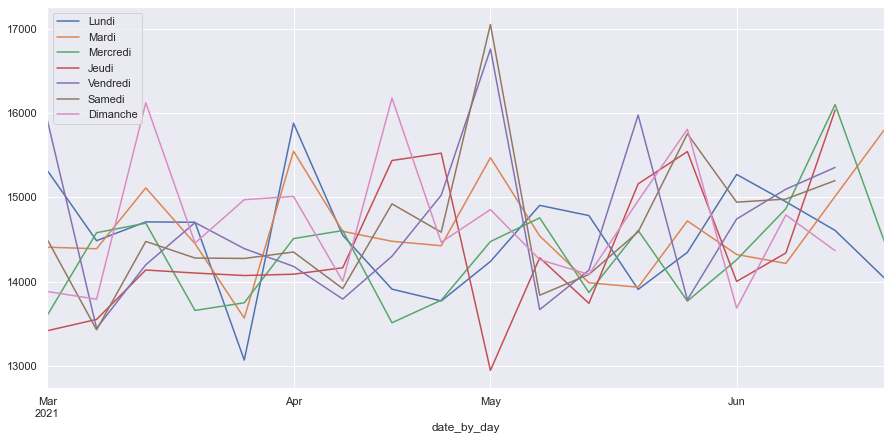

In [51]:
for i in range(7):
    df_panier_jour['2021-03':'2021-06']['ca_jour'][df_panier_jour['dayofweek']== i].plot(label = jours[i])
    plt.legend()
plt.show()

In [52]:
df_panier_jour

,date_by_day,ca_jour,mean,min,max,nb_paniers,dayofweek
date_by_day,,,,,,,
2021-03-01,2021-03-01,15319.67,33.522254,3.15,247.22,457,0
2021-03-02,2021-03-02,14409.49,32.235996,1.67,283.46,447,1
2021-03-03,2021-03-03,13602.03,33.668391,3.64,285.98,404,2
2021-03-04,2021-03-04,13418.64,32.334072,3.33,226.98,415,3
2021-03-05,2021-03-05,15918.13,34.604630,2.41,320.20,460,4
...,...,...,...,...,...,...,...
2022-02-24,2022-02-24,18857.94,36.976353,0.98,296.13,510,3
2022-02-25,2022-02-25,16906.74,38.078243,1.73,476.19,444,4
2022-02-26,2022-02-26,18687.12,37.675645,0.99,290.06,496,5


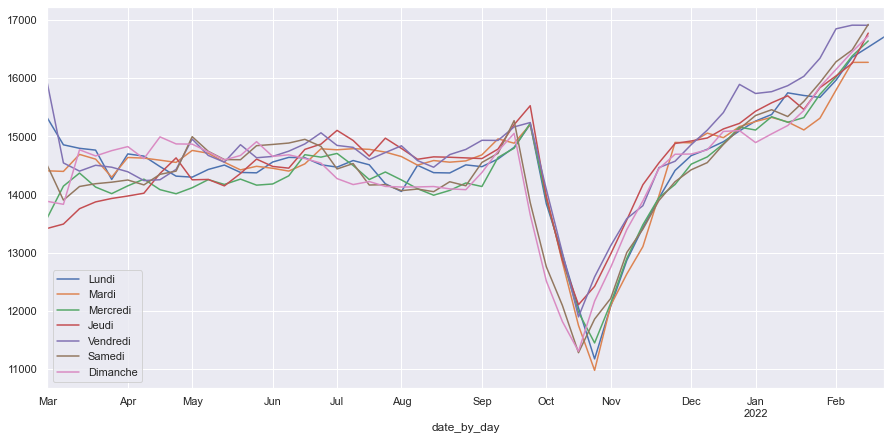

In [53]:
for i in range(7):
    df_panier_jour['ca_jour'][df_panier_jour['dayofweek']== i].ewm(alpha=0.2).mean().plot(label = jours[i])
    plt.legend()
plt.show()



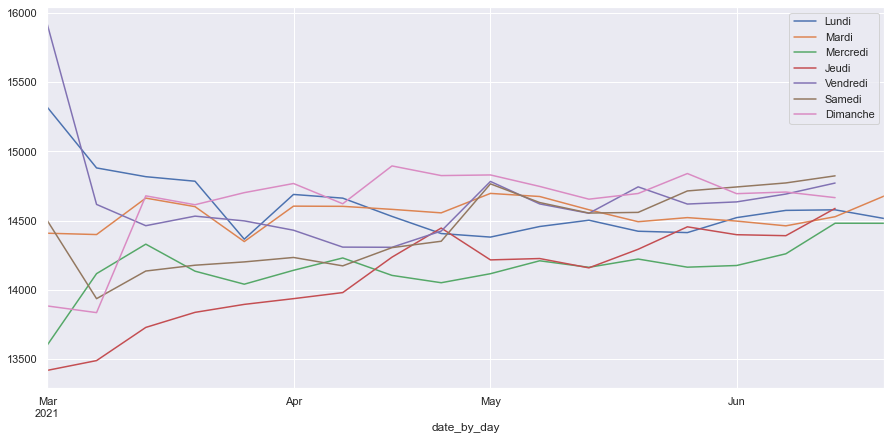

In [54]:
for i in range(7):
    df_panier_jour['2021-03':'2021-06']['ca_jour'][df_panier_jour['dayofweek']== i].ewm(alpha=0.1).mean().plot(label = jours[i])
    plt.legend()
plt.show()

## Chiffre d'affaire par semaine

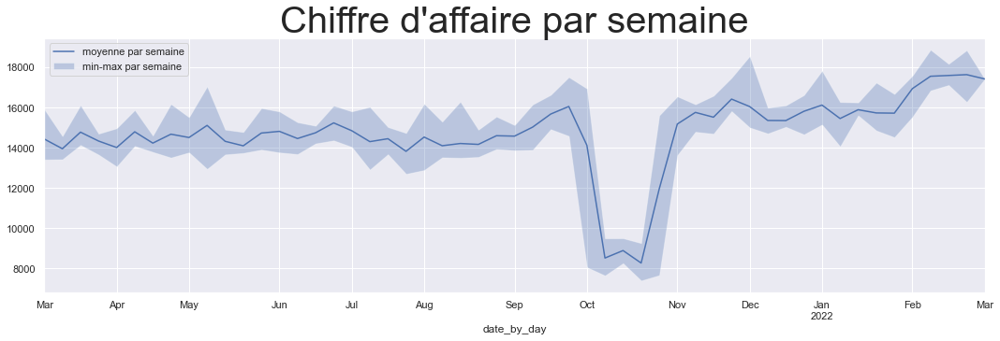

In [55]:
ca_week = df_panier_jour['ca_jour'].resample('W').agg(['mean','std','min','max'])
plt.figure(figsize = (18,5))
ca_week['mean'].plot(label = 'moyenne par semaine')
plt.fill_between(ca_week.index,ca_week['min'],ca_week['max'],alpha = 0.3,label ='min-max par semaine')
plt.title("Chiffre d'affaire par semaine",fontdict = {'fontsize' : 40})
plt.legend()
plt.show()

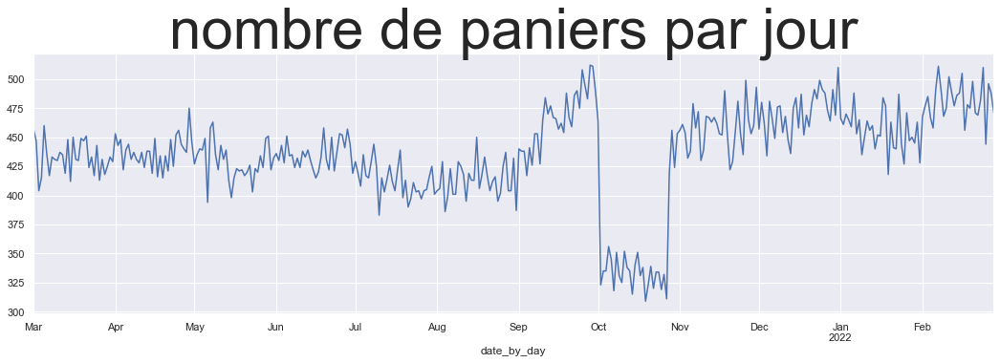

In [56]:
plt.figure(figsize = (18,5))
df_panier_jour['nb_paniers'].plot()
plt.title('nombre de paniers par jour',fontdict = {'fontsize' : 60})
plt.show()

## Valeur des paniers

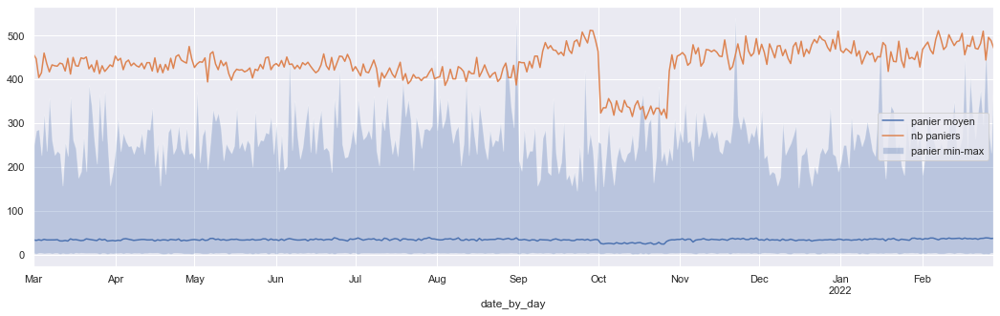

In [57]:
plt.figure(figsize = (18,5))
df_panier_jour['mean'].plot(label = 'panier moyen')
plt.fill_between(df_panier_jour.index, df_panier_jour['min'],df_panier_jour['max'],alpha=0.3,label='panier min-max')
df_panier_jour['nb_paniers'].plot(label = 'nb paniers')
plt.legend()

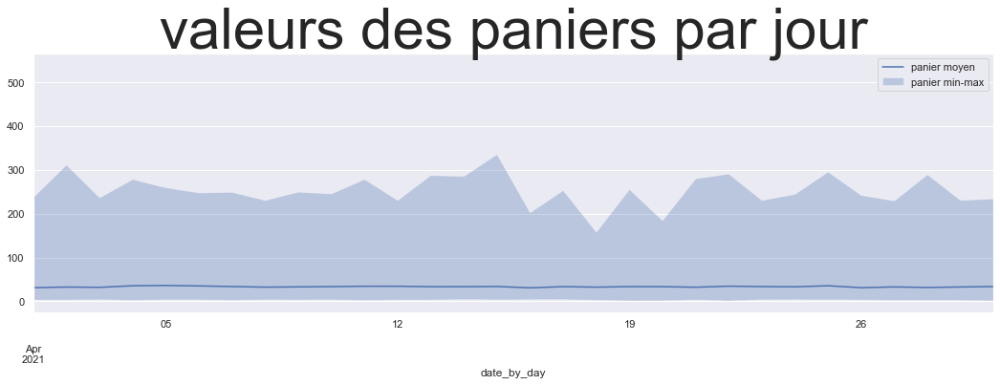

In [58]:
plt.figure(figsize = (18,5))
df_panier_jour['mean']['2021-04'].plot(label = 'panier moyen')
plt.fill_between(df_panier_jour.index, df_panier_jour['min'],df_panier_jour['max'],alpha=0.3,label='panier min-max')
plt.title('valeurs des paniers par jour',fontdict = {'fontsize' : 60})
plt.legend()

In [59]:
print(df_panier_jour['ca_jour'].mean())
print(df_panier_jour['ca_jour'].mean()
+ df_panier_jour['ca_jour'].std(ddof=0))

14692.254684931468
16760.1973942132


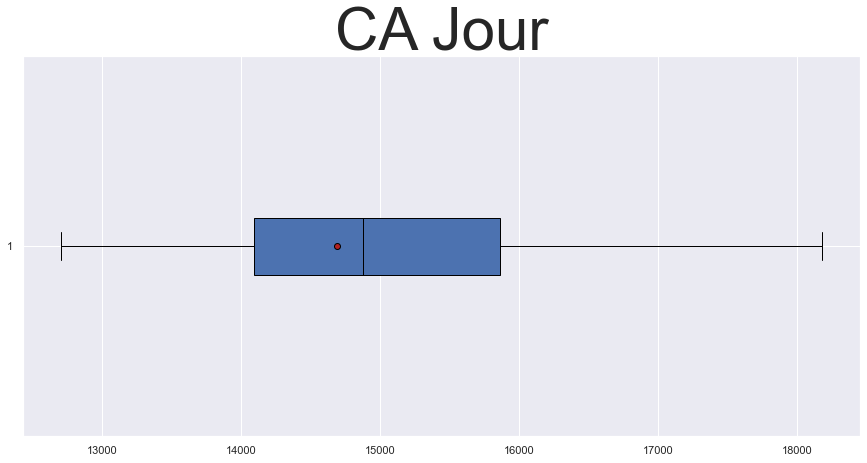

In [60]:

# Propriétés graphiques (pas très importantes)    ,labels = 'CA jour',labels = 'CA jour',
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
#plt.figure(figsize = (10,8)    
plt.boxplot(df_panier_jour['ca_jour'], showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.title('CA Jour',fontdict = {'fontsize' : 60})         
plt.show()


la repartition du price est :
mod:  0    15.99
dtype: float64
moy:  17.215188513734088
med:  13.9
var:  318.81598278368847
std:  17.85541886329437
skw:  5.479196379351586
kur:  45.42520484470879


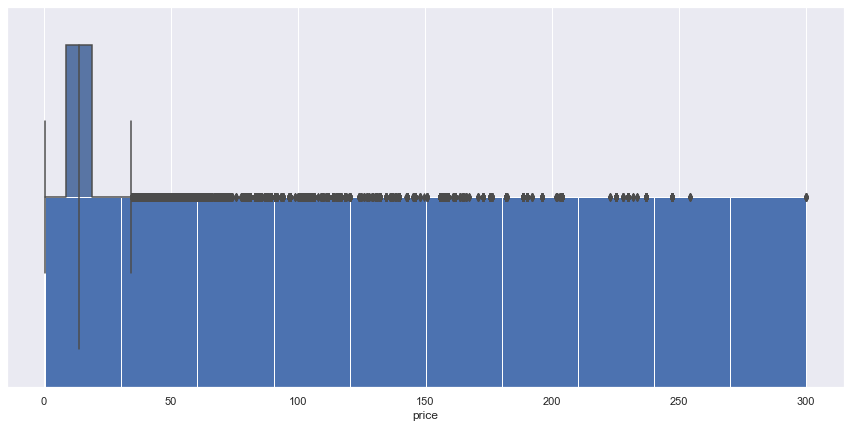


la repartition du consumer_age est :
mod:  0    41
dtype: int64
moy:  43.176432154386674
med:  41.0
var:  182.909753098325
std:  13.524413225656964
skw:  0.5804173699369056
kur:  0.45233507160756403


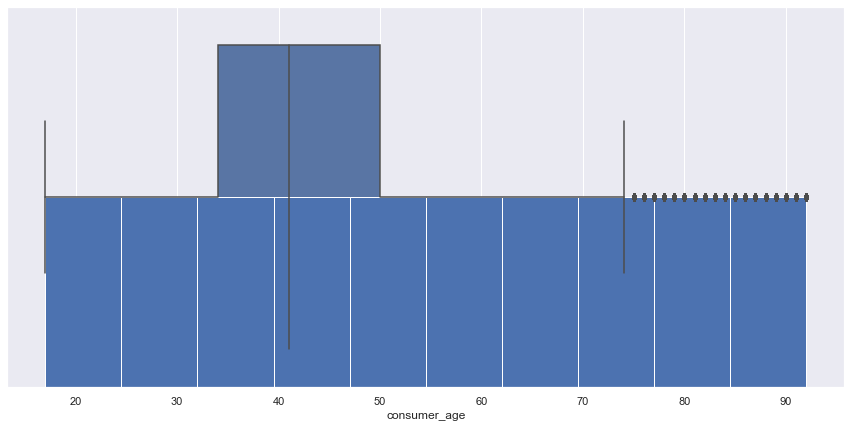

In [61]:
for col_name in ['price','consumer_age']:
    print(f'\nla repartition du {col_name} est :')
    print("mod: ",df_full[f'{col_name}'].mode())
    print("moy: ",df_full[f'{col_name}'].mean())
    print("med: ",df_full[f'{col_name}'].median())
    print("var: ",df_full[f'{col_name}'].var(ddof=0))
    print("std: ",df_full[f'{col_name}'].std(ddof=0))
    print("skw: ",df_full[f'{col_name}'].skew())
    print("kur: ",df_full[f'{col_name}'].kurtosis())
    df_full[f'{col_name}'].hist()
    sns.boxplot(x=df_full[f'{col_name}'])
    #df_full[f'{col_name}'].boxplot()
    plt.show()

# Bonus : Analyse series temporelles sur les particuliers

In [62]:
df_particuliers.head(5)

,id_prod,date,session_id,client_id,sex,birth,price,categ,consumer_age,sex_category,year,month,day,hour,date_by_day
date,,,,,,,,,,,,,,,
2022-02-28 23:59:58.040472,0_1775,2022-02-28 23:59:58.040472,s_172423,c_1460,m,1989,6.99,0,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:59:02.381670,0_1403,2022-02-28 23:59:02.381670,s_172423,c_1460,m,1989,15.99,0,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:57:12.741573,0_1538,2022-02-28 23:57:12.741573,s_172424,c_1876,m,1983,8.61,0,38,1,2022,2,28,23,2022-02-28
2022-02-28 23:56:57.561424,1_370,2022-02-28 23:56:57.561424,s_172423,c_1460,m,1989,13.11,1,32,1,2022,2,28,23,2022-02-28
2022-02-28 23:56:57.196281,1_456,2022-02-28 23:56:57.196281,s_172422,c_5787,f,1986,28.27,1,35,0,2022,2,28,23,2022-02-28


# Bonus Y'a quoi dans ce panier

## Stuff

In [7]:
df_panier

NameError: name 'df_panier' is not defined

In [64]:
df_panier['sum'].mean()

33.66969266609007

Text(0.5, 1.0, 'Valeur moyenne du panier par age')

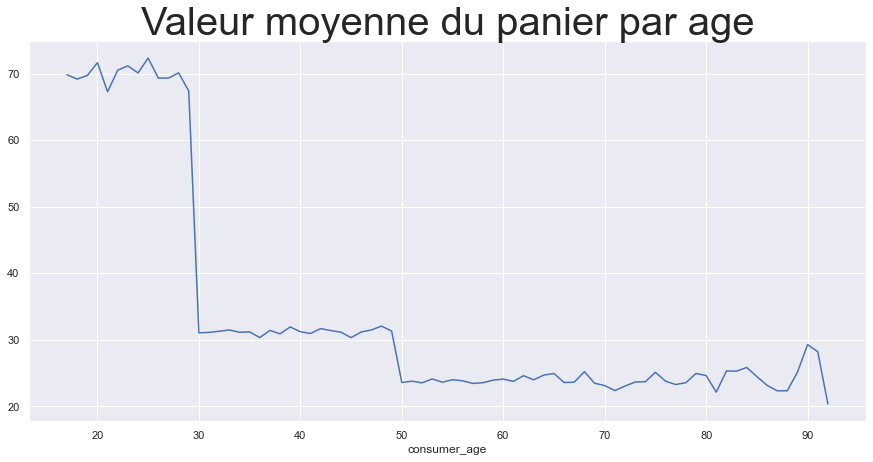

In [65]:
df_panier.groupby('consumer_age')['sum'].mean().plot()
plt.title('Valeur moyenne du panier par age',fontdict = {'fontsize' : 40})

## Nombre de paniers par age

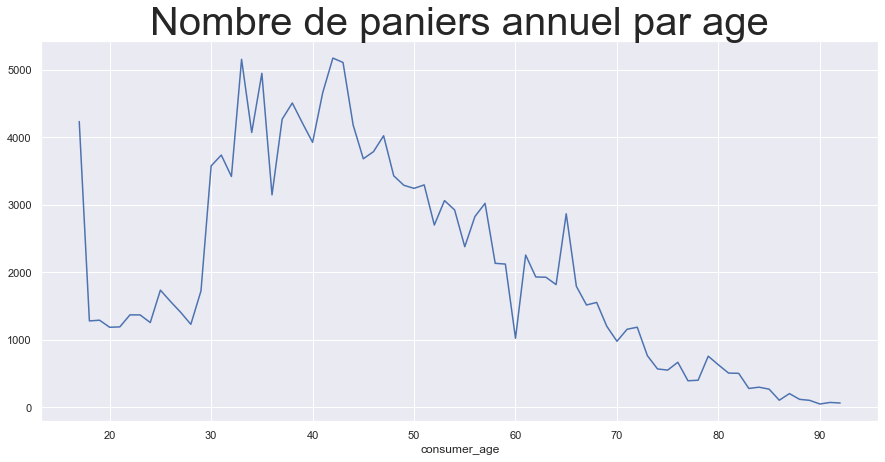

In [66]:
df_panier.groupby('consumer_age')['client_id'].count().plot()
plt.title('Nombre de paniers annuel par age',fontdict = {'fontsize' : 40})
plt.show()

In [67]:
df_panier.head(5)

,session_id,client_id,date_by_day,sex,consumer_age,list_prod,list_price,sum,mean,max,min
0,s_1,c_329,2021-03-01,f,54,[0_1259],[11.99],11.99,11.990,11.99,11.99
1,s_10,c_2218,2021-03-01,f,51,[1_635],[26.99],26.99,26.990,26.99,26.99
2,s_100,c_3854,2021-03-01,f,43,"[0_1451, 0_1030]","[19.99, 13.73]",33.72,16.860,19.99,13.73
3,s_1000,c_1014,2021-03-03,m,32,"[0_1438, 0_1449, 0_1590, 0_1625]","[9.31, 4.99, 18.93, 5.99]",39.22,9.805,18.93,4.99
4,s_10000,c_476,2021-03-22,f,32,"[0_1418, 0_1324, 1_395]","[8.57, 3.93, 28.99]",41.49,13.830,28.99,3.93


## Algo Apriori

In [60]:
list_paniers = []
for i in range(len(df_panier['list_prod'])):
    list_paniers.append(df_panier['list_prod'][i])

In [ ]:
list_paniers


In [81]:
associations = apriori(list_paniers,min_length = 2, min_support = 0.00004, min_confidence = 0.002, min_lift = 3, target = "rules")


In [82]:
df_associations = pd.DataFrame(associations)

In [35]:
list_associations = list(associations)
list_associations

[]

In [83]:
df_associations

,items,support,ordered_statistics
0,"(0_1422, 0_0)",0.000044,"[((0_0), (0_1422), 0.012433392539964476, 3.153..."
1,"(0_1447, 0_1049)",0.000044,"[((0_1049), (0_1447), 0.0330188679245283, 10.6..."
2,"(0_1335, 0_1404)",0.000044,"[((0_1335), (0_1404), 0.015521064301552107, 5...."
3,"(0_1338, 0_1432)",0.000044,"[((0_1338), (0_1432), 0.014705882352941178, 4...."
4,"(0_1344, 0_1362)",0.000044,"[((0_1344), (0_1362), 0.0155902004454343, 5.06..."
5,"(0_1347, 0_1431)",0.000044,"[((0_1347), (0_1431), 0.014799154334038056, 3...."
6,"(0_1349, 0_1454)",0.000044,"[((0_1349), (0_1454), 0.014675052410901468, 5...."
7,"(0_1350, 0_1358)",0.000044,"[((0_1350), (0_1358), 0.014227642276422764, 4...."
8,"(0_1440, 0_1352)",0.000044,"[((0_1352), (0_1440), 0.014583333333333335, 4...."
9,"(0_1361, 0_1429)",0.000044,"[((0_1361), (0_1429), 0.014256619144602852, 4...."


In [64]:
toto = [x for x in df_associations['items'][1]][0]

In [84]:
df_associations['confidence'],df_associations['lift'] = df_associations['support'] ,df_associations['support'] 
df_associations['objet_1'],df_associations['objet_2'] = '',''
for i in range(len(df_associations['support'])):
    df_associations['confidence'][i]=df_associations['ordered_statistics'][i][0][2]
    df_associations['lift'][i] = df_associations['ordered_statistics'][i][0][3]
    #toto = 
    df_associations['objet_1'][i] = [x for x in df_associations['items'][i]][0]
    df_associations['objet_2'][i] = [x for x in df_associations['items'][i]][1]
df_associations.drop(['ordered_statistics'],axis=1,inplace=True)

<ipython-input-84-a4a706bec6a4>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_associations['confidence'][i]=df_associations['ordered_statistics'][i][0][2]
<ipython-input-84-a4a706bec6a4>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_associations['lift'][i] = df_associations['ordered_statistics'][i][0][3]
<ipython-input-84-a4a706bec6a4>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_associations['objet_1'][i] = [x for x

In [77]:
for i in range(len(df_associations['support'])):
    #toto = 
    df_associations['objet_1'][i] = [x for x in df_associations['items'][i]][0]
    df_associations['objet_2'][i] = [x for x in df_associations['items'][i]][1]

<ipython-input-77-1a17406e9828>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_associations['objet_1'][i] = [x for x in df_associations['items'][i]][0]
<ipython-input-77-1a17406e9828>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_associations['objet_2'][i] = [x for x in df_associations['items'][i]][1]


In [85]:
df_associations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51 entries, 0 to 50
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   items       51 non-null     object 
 1   support     51 non-null     float64
 2   confidence  51 non-null     float64
 3   lift        51 non-null     float64
 4   objet_1     51 non-null     object 
 5   objet_2     51 non-null     object 
dtypes: float64(3), object(3)
memory usage: 2.5+ KB


In [86]:
df_associations

,items,support,confidence,lift,objet_1,objet_2
0,"(0_1422, 0_0)",0.000044,0.012433,3.153350,0_1422,0_0
1,"(0_1447, 0_1049)",0.000044,0.033019,10.667372,0_1447,0_1049
2,"(0_1335, 0_1404)",0.000044,0.015521,5.118191,0_1335,0_1404
3,"(0_1338, 0_1432)",0.000044,0.014706,4.045337,0_1338,0_1432
4,"(0_1344, 0_1362)",0.000044,0.015590,5.067547,0_1344,0_1362
5,"(0_1347, 0_1431)",0.000044,0.014799,3.995094,0_1347,0_1431
6,"(0_1349, 0_1454)",0.000044,0.014675,5.015750,0_1349,0_1454
7,"(0_1350, 0_1358)",0.000044,0.014228,4.408715,0_1350,0_1358
8,"(0_1440, 0_1352)",0.000044,0.014583,4.170074,0_1440,0_1352
9,"(0_1361, 0_1429)",0.000044,0.014257,4.106138,0_1361,0_1429


In [87]:
if not os.path.exists('network'):
    os.mkdir('network')
df_associations.to_csv (r'./network/df_associations3.csv', index = False, header=True)

# Tentatives de Graph Network Infructueuses

In [ ]:
df_graph=  pd.DataFrame({ 'from':df_associations['objet_1'].values, 'to':df_associations['objet_2'].values})
G=nx.from_pandas_edgelist(df_graph, 'from', 'to')

NameError: name 'df_associations' is not defined

In [ ]:
nx.draw(G)
plt.show()

NetworkXError: random_state_index is incorrect

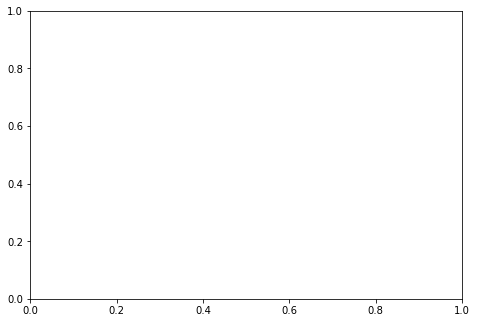

In [ ]:
df = pd.DataFrame({ 'from':['A', 'B', 'C','A'], 'to':['D', 'A', 'E','C']})
 
# Build your graph
G=nx.from_pandas_edgelist(df, 'from', 'to')
 
# Plot it
nx.draw(G, with_labels=True)
plt.show()

NetworkXError: random_state_index is incorrect

## Test NetworkX

In [ ]:
G = nx.Graph()
G.add_edge(1, 2)
G.add_edge(1, 3)
G.add_edge(1, 5)
G.add_edge(2, 3)
G.add_edge(3, 4)
G.add_edge(4, 5)
'''
# explicitly set positions
pos = {1: (0, 0), 2: (-1, 0.3), 3: (2, 0.17), 4: (4, 0.255), 5: (5, 0.03)}

options = {
    "font_size": 36,
    "node_size": 3000,
    "node_color": "white",
    "edgecolors": "black",
    "linewidths": 5,
    "width": 5,
}'''
nx.draw_networkx(G)

# Set margins for the axes so that nodes aren't clipped
ax = plt.gca()
ax.margins(0.20)
plt.axis("off")
plt.show()

NetworkXError: random_state_index is incorrect

NetworkXError: random_state_index is incorrect

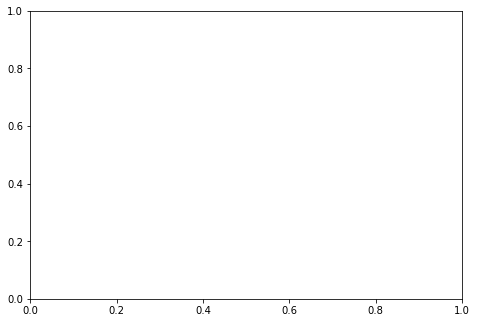

In [ ]:
G = nx.Graph()
G.add_edges_from([(1, 2), (1, 3)])

G.add_node(1)
G.add_node(3)
G.add_node(2)
nx.draw(G)
plt.show()

NetworkXError: random_state_index is incorrect

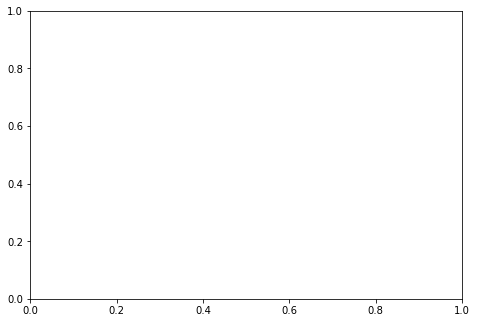

In [ ]:
G.add_edge(1, 2)

H = nx.DiGraph(G)   # create a DiGraph using the connections from G

list(H.edges())
[(1, 2), (2, 1)]

edgelist = [(0, 1), (1, 2), (2, 3)]

H = nx.Graph(edgelist)
nx.draw(H)
plt.show()

In [ ]:
G = nx.grid_2d_graph(5, 5)  # 5x5 grid

# print the adjacency list
for line in nx.generate_adjlist(G):
    print(line)
# write edgelist to grid.edgelist
nx.write_edgelist(G, path="grid.edgelist", delimiter=":")
# read edgelist from grid.edgelist
H = nx.read_edgelist(path="grid.edgelist", delimiter=":")

nx.draw(H)
plt.show()

NetworkXError: random_state_index is incorrect

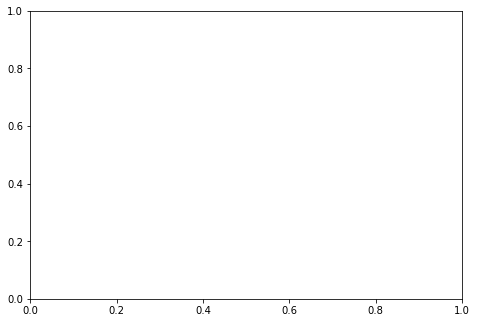

In [ ]:
# Create a networkx graph object
my_graph = nx.Graph() 
 
# Add edges to to the graph object
# Each tuple represents an edge between two nodes
my_graph.add_edges_from([
                        (1,2), 
                        (1,3), 
                        (3,4), 
                        (1,5), 
                        (3,5),
                        (4,2),
                        (2,3),
                        (3,0)])
 
# Draw the resulting graph
nx.draw(my_graph, with_labels=True, font_weight='bold')